In [1]:
import sys
sys.path.append("../scripts/python")
sys.path.append("../algotom")
import amglib.imageutils as utils
import amglib.readers as io
from tqdm.notebook import tqdm
import numpy as np
import matplotlib.pyplot as plt
import skimage as im
import scipy.io
import os
from skimage.measure import EllipseModel
from matplotlib.patches import Ellipse

import importlib

C:\Users\zhan_q\Documents\CIL\../scripts/python\amglib\imageutils.py:8: FutureWarning: Importing from skimage.morphology.greyreconstruct is deprecated. Please import from skimage.morphology instead.
  import skimage.morphology.greyreconstruct as rec


In [2]:
datapath = 'E:\\Zhan_q\\P20220873\\02_rawdata2\\06_ct20s\\'

In [4]:
dc=io.read_images(datapath+'dc20s_{:05}.fits',first=1,last=10,averageStack=True,average='mean');
ob=io.read_images(datapath+'ob20s_{:05}.fits',first=1,last=10,averageStack=True,average='mean');
bbob1 = io.read_image(datapath+'bbob20s_00001.fits');
bb1 = io.read_image(datapath+'bbs20s_00001.fits');
bb2 = io.read_image(datapath+'bbs20s_00002.fits');

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

In [5]:
bb3 = io.read_image(datapath+'bbs20s_00003.fits');
bb4 = io.read_image(datapath+'bbs20s_00004.fits');

In [8]:
bbs = io.read_images(datapath+'bbs20s_{:05}.fits', first=1, last=5, averageStack=True, average='mean');
bbob = io.read_images(datapath+'bbob20s_{:05}.fits', first=1, last=5, averageStack=True, average='mean');

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

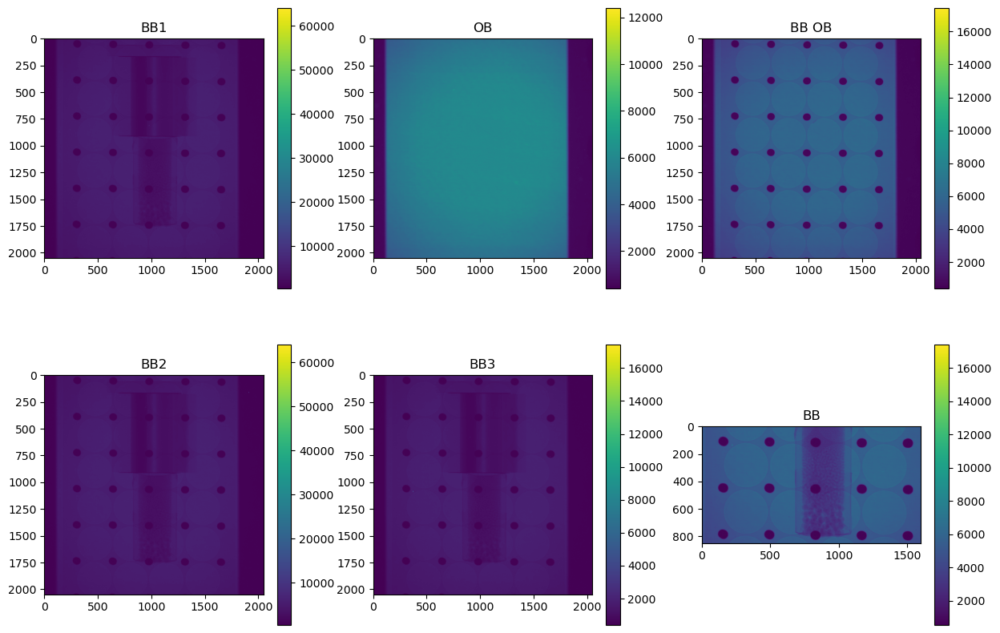

In [142]:
fig, ax = plt.subplots(2,3,figsize=(15,10))
ax=ax.ravel()

a0 = ax[0].imshow(bb1)
fig.colorbar(a0, ax=ax[0])
ax[0].set_title('BB1')

a1=ax[1].imshow(ob)#, vmin=0.0,vmax=10000)
fig.colorbar(a1,ax=ax[1])
ax[1].set_title('OB')

a2=ax[2].imshow(bbob)
fig.colorbar(a2,ax=ax[2])
ax[2].set_title('BB OB');

a3 = ax[3].imshow(bb2)
fig.colorbar(a3, ax=ax[3])
ax[3].set_title('BB2');

a4=ax[4].imshow(bb3)
fig.colorbar(a2,ax=ax[4])
ax[4].set_title('BB3');

a5 = ax[5].imshow(bbs[950:1800,150:1750])
fig.colorbar(a5, ax=ax[5])
ax[5].set_title('BB');

In [143]:
dc = dc[950:1800,150:1750]
ob = ob[950:1800,150:1750]
bbob = bbob[950:1800,150:1750]
bbs = bbs[950:1800,150:1750]

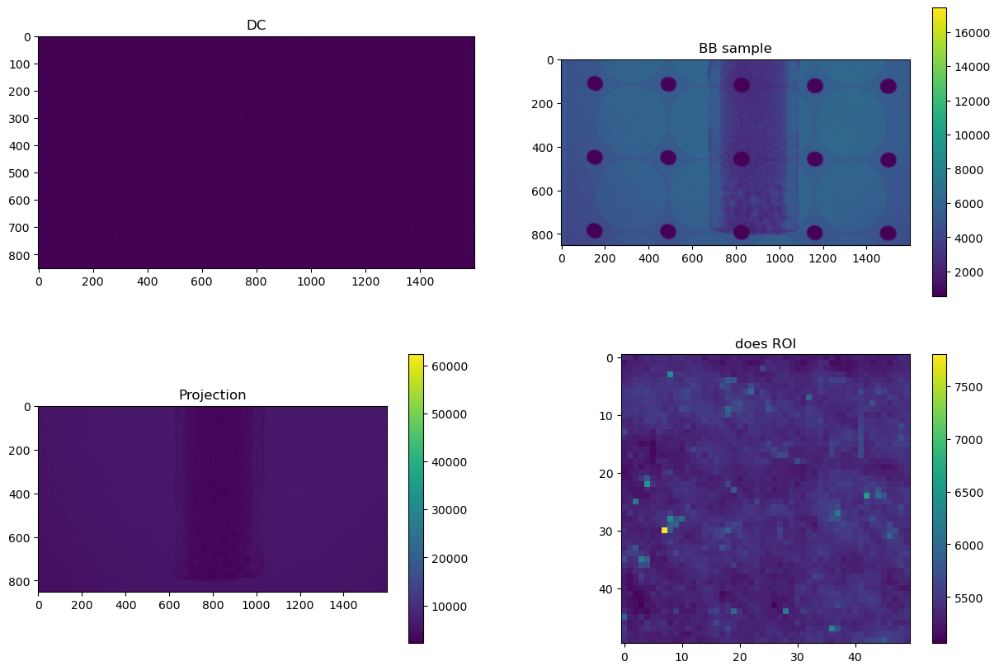

In [161]:
fig, ax = plt.subplots(2,2,figsize=(15,10))
ax=ax.ravel()
ax[0].imshow(dc)
ax[0].set_title('DC')
a1=ax[1].imshow(bbs)
fig.colorbar(a1,ax=ax[1])
ax[1].set_title('BB sample')
a2=ax[2].imshow(ImgRaw[300,:,:]) #,vmin=0.0,vmax=10000)
fig.colorbar(a2,ax=ax[2])
ax[2].set_title('Projection');
a3=ax[3].imshow(bbs[600:650,300:350]) #,vmin=0.0,vmax=10000)
fig.colorbar(a3,ax=ax[3])
ax[3].set_title('does ROI');

### BB correction

In [9]:
import amglib.readers as rd
import amglib.bb as bb
from skimage.measure import label, regionprops
import pandas as pd
import skimage.morphology as morph
import skimage.filters as filt
from skimage.feature import match_template
from skimage.draw import disk

In [184]:
import importlib
importlib.reload(rd)
importlib.reload(bb)

<module 'amglib.bb' from 'C:\\Users\\zhan_q\\Documents\\CIL\\../scripts/python\\amglib\\bb.py'>

In [12]:
proj = io.read_image(datapath+'ct20s_00001.fits')

3820
3749
3823
3892
4013
3834
3859
3858
3821
3892
3962
3875
3800
3831
4008


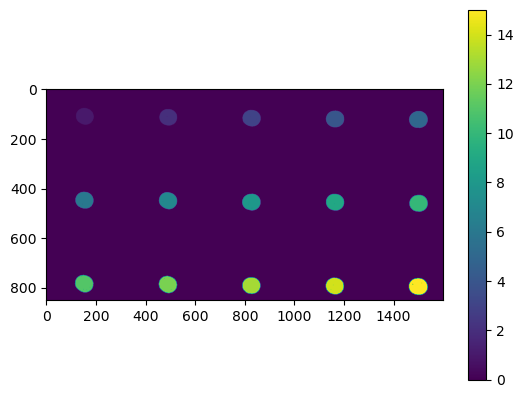

In [147]:
#plt.imshow(bbob<2100)
plt.imshow(label(bbob<2000))
plt.colorbar()
lbb=label(label(bbob<2000))
props = regionprops(lbb)
for region in props:
    print(region.area)

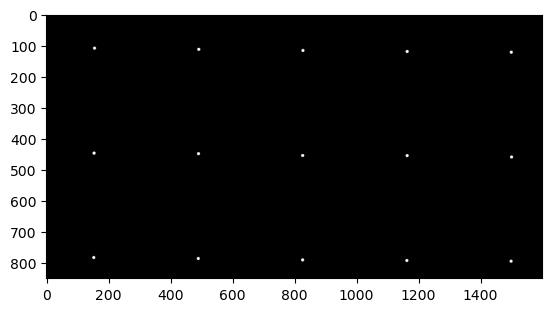

In [148]:
mask,r,c,regions = bb.get_black_bodies(bbob, greythres = 2000, areas=[3000,5000],R=5)
plt.imshow(mask, cmap='gray')

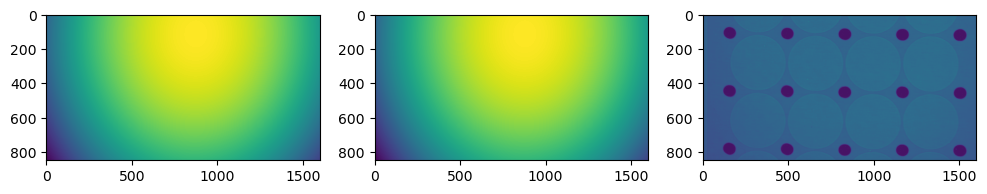

In [150]:
sob=bb.compute_scatter_image_from_df(regions,bbs.shape)
ss=bb.compute_scatter_image_from_df(regions,bbs.shape)
fig,ax = plt.subplots(1,3,figsize=(12,6))
ax[0].imshow(sob, vmin=ss.min(),vmax=ss.max())
ax[1].imshow(ss)
ax[2].imshow(bbob-dc-sob)

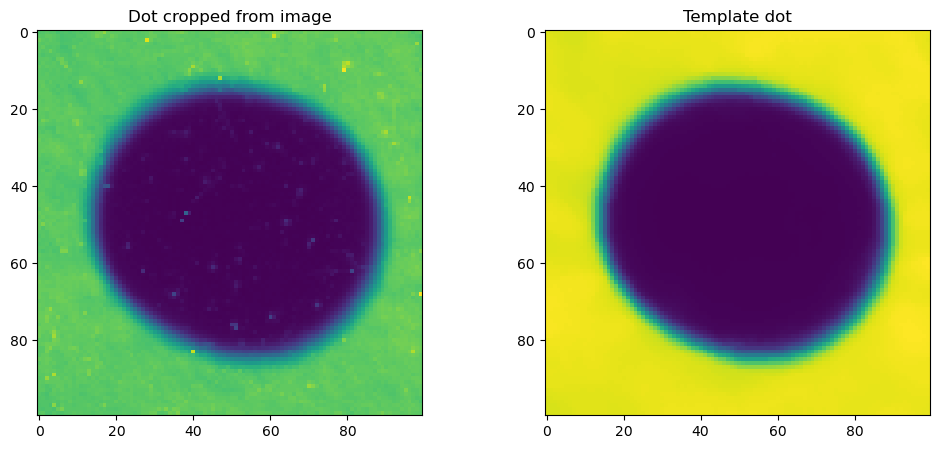

In [155]:
fig,ax=plt.subplots(1,2,figsize=(12,5))

a = bbs-dc
ax[0].imshow(a[400:500,440:540])
ax[0].set_title('Dot cropped from image')
template=bb.get_dot_template((bbs-dc),roi=[400,440,500,540])
ax[1].imshow(template)
ax[1].set_title('Template dot');

In [185]:
obmask,r,c,bbdf,_ = bb.get_blackbodies_by_templatematching(bbob-dc,template,0.5)

obest=bb.compute_scatter_image_from_df(bbdf,obmask.shape)

cmap = 'coolwarm'
fig,ax=plt.subplots(1,3,figsize=(12,5))
df=bb.check_scatter_image(bbob-dc,0,obmask,ax=ax[0],cmap='viridis')
ax[0].set_title('Intensity behind BBs')
a1=ax[1].imshow(obest,cmap='viridis')
ax[1].set_title('Scatter estimate')
fig.colorbar(a1,ax=ax[1],shrink=0.5)
df=bb.check_scatter_image(bbob-dc,obest,obmask,ax=ax[2],cmap=cmap,sym_cmap=True)
ax[2].set_title('Measured - Estimated');

KeyError: 'median'

In [86]:
# Projection normalized with dose correction
nimg_dose = bb.normalize(proj,ob,dc, dose_roi = [600,500,650,550], logarithm=False)

# Projection normalized with scattering correction
nimg_sc   = bb.normalization_with_BB(proj,ob,dc,bbs,bbob,ss,sob,[500,500,550,550],0.97)

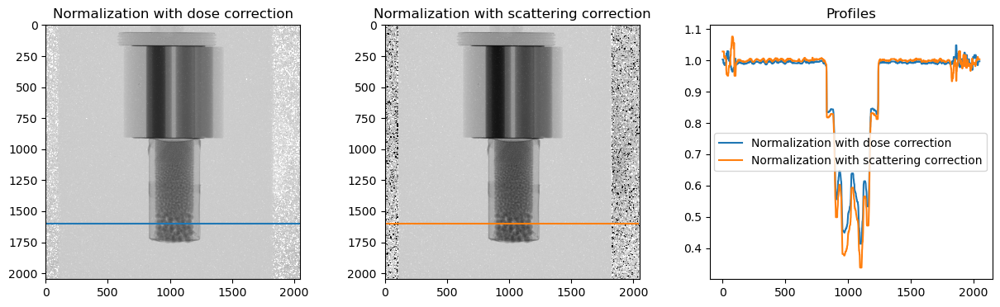

In [92]:
# Visualization 
N=25
hline = 1600
n=10

prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']

fig, ax = plt.subplots(1,3,figsize=(15,4))

ax[0].imshow(nimg_dose,vmin=0,vmax=1.25,cmap='gray')
ax[0].set_title('Normalization with dose correction')
ax[0].hlines(hline,xmin=0,xmax=2047,color=colors[0])

ax[1].imshow(nimg_sc,vmin=0,vmax=1.25,cmap='gray')
ax[1].set_title('Normalization with scattering correction')
ax[1].hlines(hline,xmin=0,xmax=2047,color=colors[1])

ax[2].plot(filt.median(nimg_dose[hline:hline+n].mean(axis=0), np.ones(N)),  label='Normalization with dose correction')
ax[2].plot(filt.median(nimg_sc[hline:hline+n].mean(axis=0),   np.ones(N)),  label='Normalization with scattering correction')

ax[2].set_title('Profiles')

ax[2].legend();

In [94]:
ImgRaw = io.read_images(datapath+'ct20s_{:05}.fits',first=1,last = 1126,stride=1); 

  0%|          | 0/1126 [00:00<?, ?it/s]

In [157]:
ImgRaw = ImgRaw[:,950:1800,150:1750]

In [162]:
ImgNorm = bb.normalization_with_BB(ImgRaw,ob,dc,bbs,bbob,ss,sob,[600,300,650,350],0.97).astype('float32');
#utils.normalizeImage(ImgRaw, ob, dc, neglog = True, doseROI = [150,100,200,150]).astype('float32');

In [164]:
ImgNorm=-np.log(ImgNorm).astype('float32');

C:\Users\zhan_q\AppData\Local\Temp\ipykernel_11008\2492741168.py:1: RuntimeWarning: invalid value encountered in log
  ImgNorm=-np.log(ImgNorm).astype('float32');


In [176]:
ImgNorm_dose = bb.normalize(ImgRaw,ob,dc, dose_roi = [600,300,650,350], logarithm=True).astype('float32');

In [177]:
print(ImgNorm_dose.shape)

(1126, 850, 1600)


In [104]:
# Import all CIL components needed
from cil.framework import ImageData, ImageGeometry
from cil.framework import AcquisitionGeometry, AcquisitionData

# CIL Processors
from cil.processors import CentreOfRotationCorrector, Slicer, TransmissionAbsorptionConverter, Normaliser, Padder

# CIL display tools
from cil.utilities.display import show2D, show_geometry

# From CIL ASTRA plugin
from cil.plugins.astra import ProjectionOperator, FBP

from cil.processors import RingRemover, Binner
from cil.utilities.jupyter import islicer, link_islicer
from cil.processors import Masker, MaskGenerator

import logging
logging.basicConfig(level=logging.WARNING)
cil_log_level = logging.getLogger('cil.processors')
cil_log_level.setLevel(logging.INFO)

In [171]:
agRaw = AcquisitionGeometry.create_Parallel3D()  \
         .set_panel(num_pixels=(1600, 850))        \
         .set_angles(angles=np.linspace(0, 360, num=1126, endpoint=False))

In [172]:
agRaw.set_labels(['angle','vertical','horizontal'])
print(agRaw.dimension_labels)

('angle', 'vertical', 'horizontal')


In [178]:
data3D = AcquisitionData(ImgNorm_dose, geometry=agRaw, deep_copy=False)

In [183]:
islicer(data3D, cmap='inferno', 
        minmax=(0,1.2), 
        size=(7,7))

interactive(children=(IntSlider(value=563, continuous_update=False, description='angle', max=1125), FloatRange…

IntSlider(value=563, continuous_update=False, description='angle', max=1125)

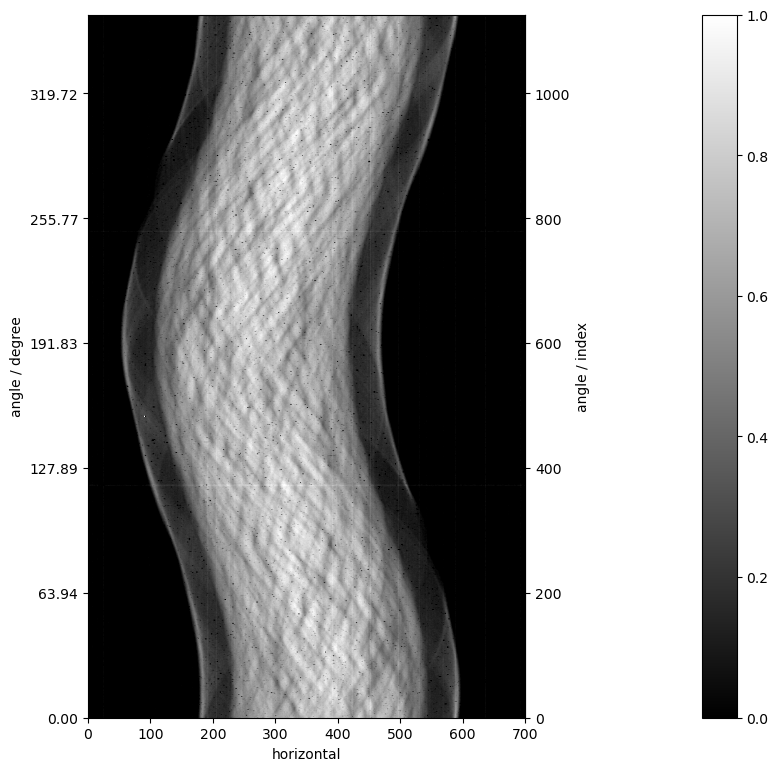

In [201]:
nv = 400
data3D_roi = Slicer(roi={'horizontal':(500,1200)})(data3D)
data2D = data3D_roi.get_slice(vertical=nv)
show2D(data2D,\
      fix_range=(0,1.0),
      cmap='gray')

In [263]:
test_06_ct20s = Slicer(roi={'horizontal':(500,1200)})(data3D)
%store test_06_ct20s

Stored 'test_06_ct20s' (AcquisitionData)


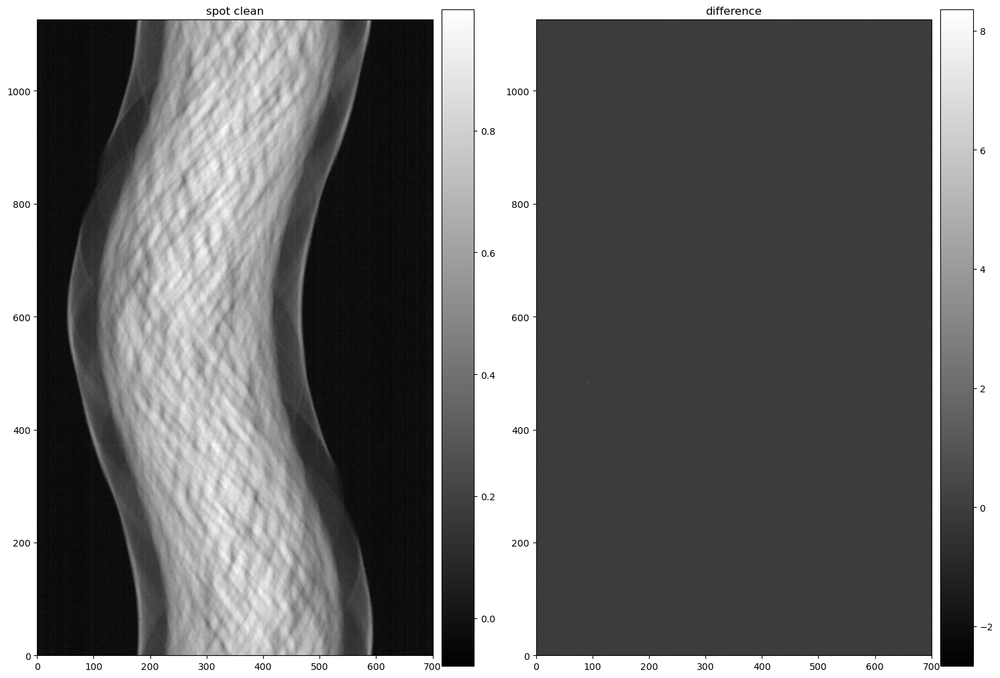

In [202]:
sino0 = utils.spotclean(data2D.as_array(),size=5,threshold=0.95)
sino0 = sino0.astype('float32')

show2D([sino0, 
        #data2D.as_array(), 
        data2D.as_array()-sino0],
       ['spot clean', 
        #'original', 
        'difference'],
       #fix_range=(0,1.2),
       #num_cols=3
      )

In [207]:
import algotom.prep.removal as srm

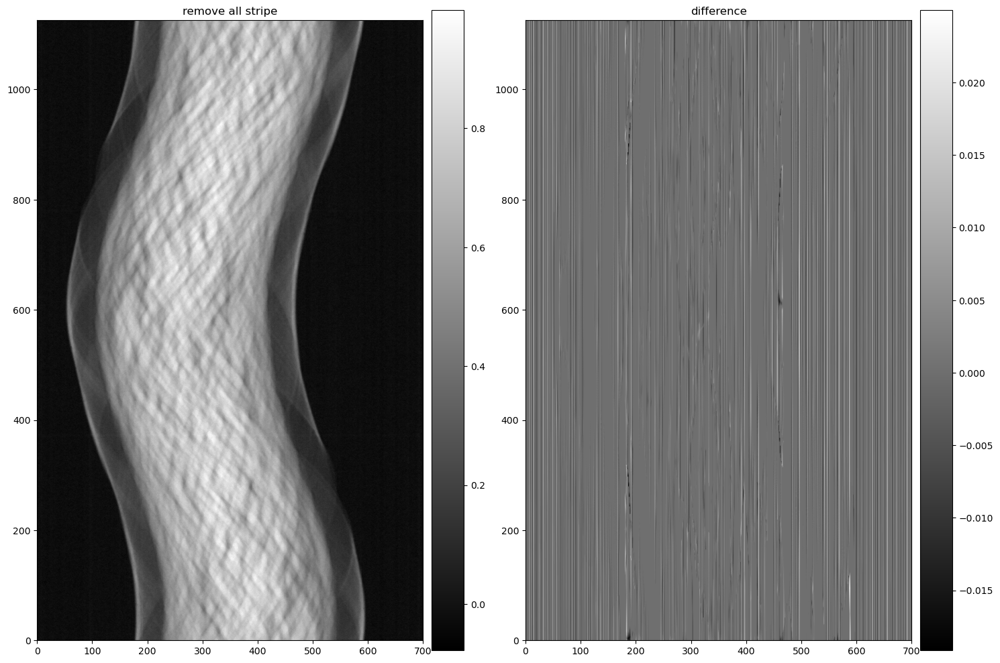

In [240]:
sino1 = srm.remove_stripe_based_filtering(sino0, sigma=3, size=5, 
                      dim=1, sort=True)
sino1 = sino1.astype('float32')
show2D([sino1, sino0-sino1],
       ['remove all stripe', 'difference'],
      )

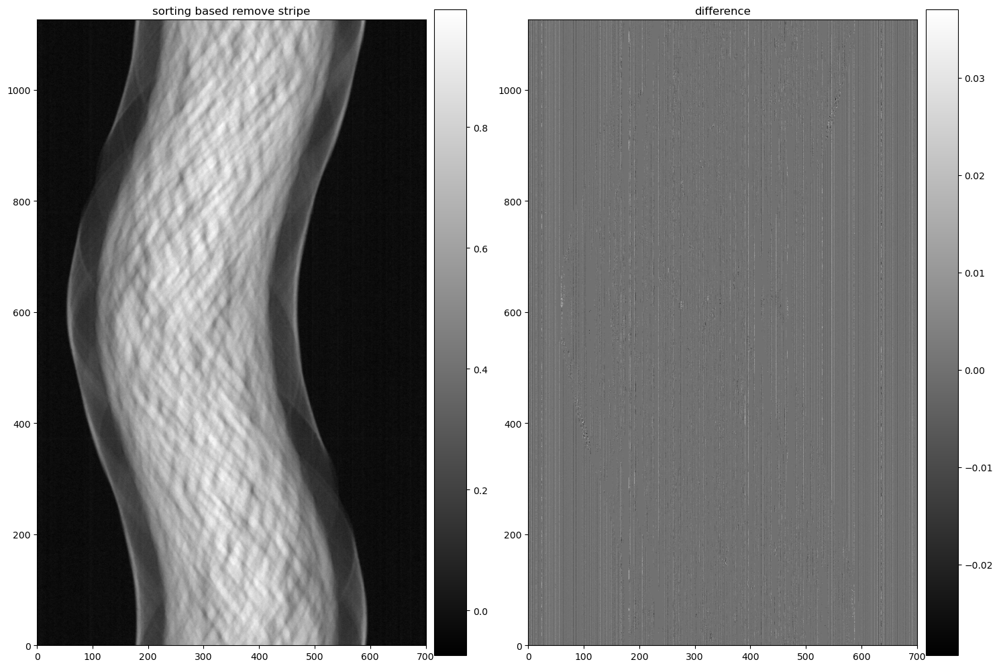

In [225]:
sino1 = srm.remove_stripe_based_sorting(sino0, size=3, dim=1)
sino1 = sino1.astype('float32')
show2D([sino1, sino0-sino1],
       ['sorting based remove stripe', 'difference'],
      )


In [241]:
data_clean = data2D.clone()
data_clean.fill(sino1)

In [242]:
data_clean = CentreOfRotationCorrector.image_sharpness('centre',\
                                                            backend='astra',\
                                                        search_range=150, \
                                                            tolerance=0.005)(data_clean)

INFO:cil.processors.CofR_image_sharpness:evaluated 17 points
INFO:cil.processors.CofR_image_sharpness:Centre of rotation correction found using image_sharpness
INFO:cil.processors.CofR_image_sharpness:backend FBP/FDK astra
INFO:cil.processors.CofR_image_sharpness:Calculated from slice: centre
INFO:cil.processors.CofR_image_sharpness:Centre of rotation shift = -26.105078 pixels
INFO:cil.processors.CofR_image_sharpness:Centre of rotation shift = -26.105078 units at the object
INFO:cil.processors.CofR_image_sharpness:Return new dataset with centred geometry


In [243]:
ig2D = data_clean.geometry.get_ImageGeometry()
ag2D = data_clean.geometry
fbp_recon_2D = FBP(ig2D,ag2D, device='gpu')(data_clean)

In [264]:
fbp_recon_2D2 = FBP(ig2D2, ag2D2, device='gpu')(data_clean2)
fbp_recon_2D4 = FBP(ig2D4, ag2D4, device='gpu')(data_clean4)
fbp_recon_2D8 = FBP(ig2D8, ag2D8, device='gpu')(data_clean8)

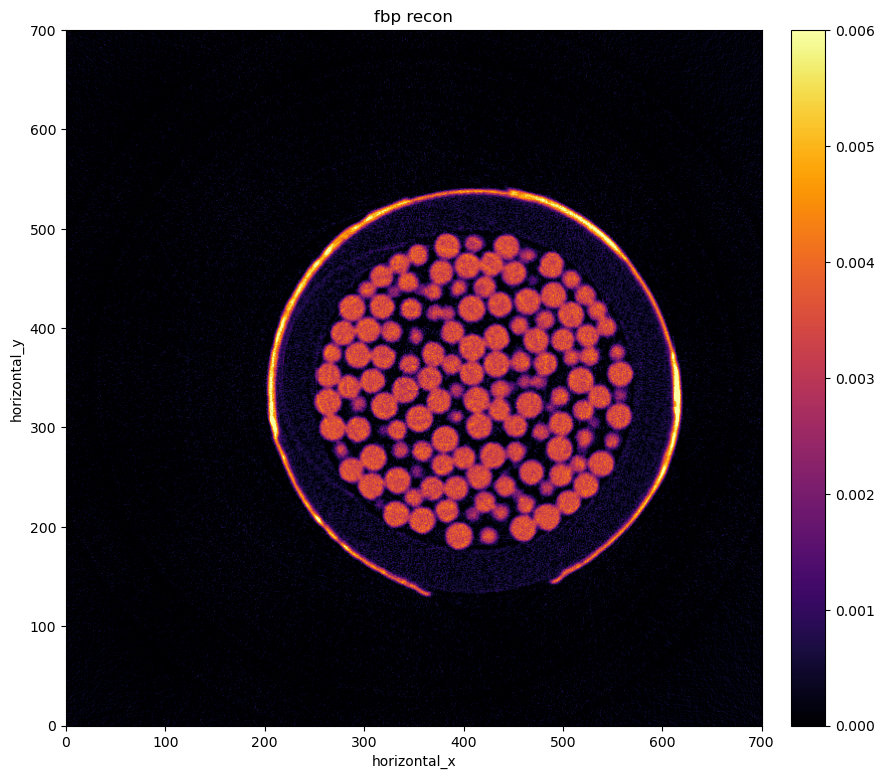

In [244]:
show2D(fbp_recon_2D, 'fbp recon', cmap='inferno', fix_range=(0, 0.006))

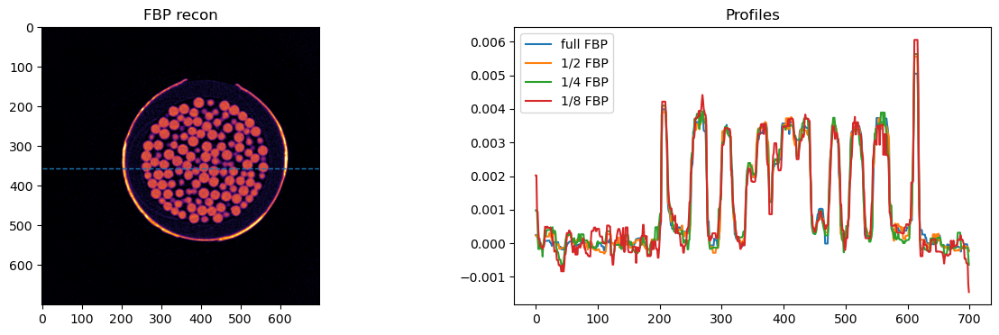

In [265]:
import skimage.filters as filt
import matplotlib.pyplot as plt

prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']

nh = 355
fig, ax = plt.subplots(1,2,figsize=(15,4))
ax[0].imshow(fbp_recon_2D.as_array(),vmin=0,vmax=0.006,cmap='inferno')
ax[0].set_title('FBP recon')
ax[0].hlines(nh,xmin=0,xmax=699,color=colors[0], ls = '--', linewidth=1)

N=10
ax[1].plot(filt.median(fbp_recon_2D.as_array()[nh],np.ones(N)),label="full FBP")
ax[1].plot(filt.median(fbp_recon_2D2.as_array()[nh],np.ones(N)),label="1/2 FBP")
ax[1].plot(filt.median(fbp_recon_2D4.as_array()[nh],np.ones(N)),label="1/4 FBP")
ax[1].plot(filt.median(fbp_recon_2D8.as_array()[nh],np.ones(N)),label="1/8 FBP")
ax[1].set_title('Profiles')
ax[1].legend()

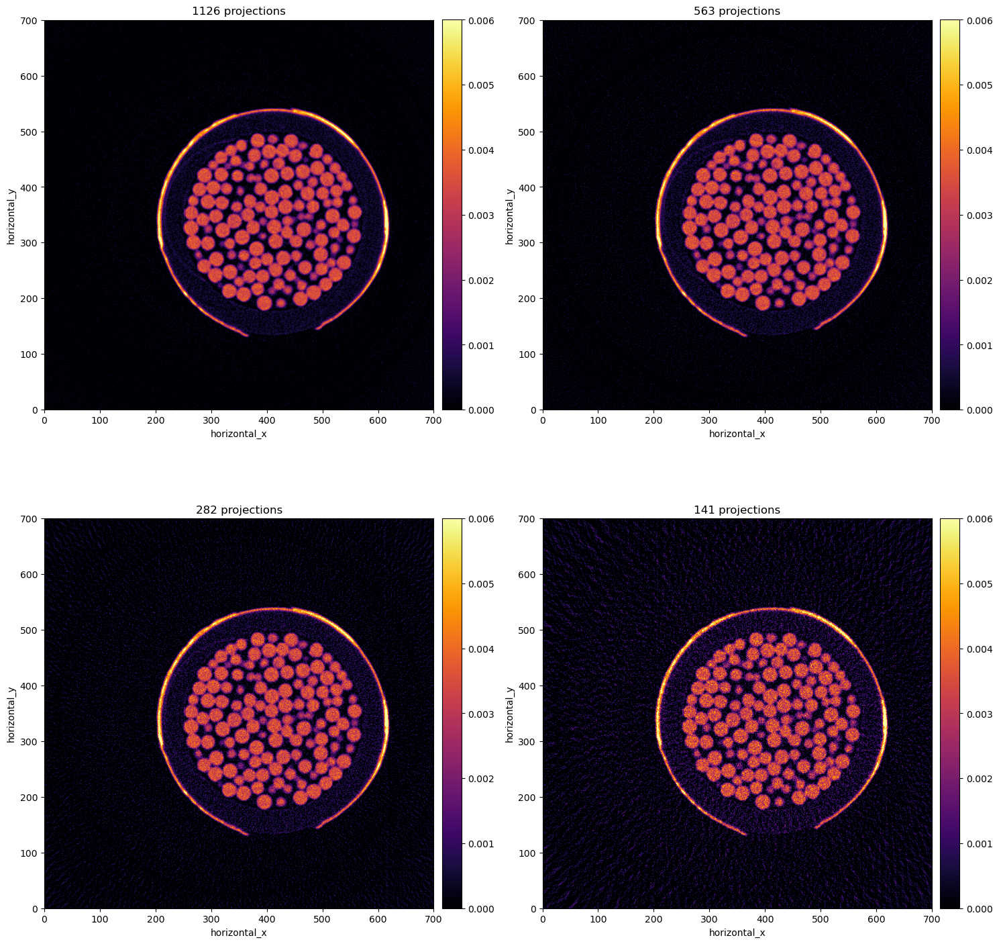

In [266]:
show2D([fbp_recon_2D, fbp_recon_2D2, fbp_recon_2D4, fbp_recon_2D8],
      ['1126 projections', '563 projections', '282 projections', '141 projections'], 
      cmap = 'inferno', 
      fix_range=(0,0.006))

### SIRT recons

In [255]:

from cil.plugins.astra.operators import ProjectionOperator
from cil.optimisation.algorithms import SIRT

#data_clean = CentreOfRotationCorrector.image_sharpness('centre',\
#                                                            backend='astra',\
#                                                        search_range=250, \
#                                                            tolerance=0.005)(data_clean)
data_clean2 = Slicer(roi={'angle': (0,-1,2)})(data_clean)
data_clean4 = Slicer(roi={'angle': (0,-1,4)})(data_clean)
data_clean8 = Slicer(roi={'angle': (0,-1,8)})(data_clean)

#ig2D = data_clean.geometry.get_ImageGeometry()
#ag2D = data_clean.geometry

ig2D2 = data_clean2.geometry.get_ImageGeometry()
ag2D2 = data_clean2.geometry

ig2D4 = data_clean4.geometry.get_ImageGeometry()
ag2D4 = data_clean4.geometry

ig2D8 = data_clean8.geometry.get_ImageGeometry()
ag2D8 = data_clean8.geometry

A = ProjectionOperator(ig2D,ag2D, device="gpu")
A2 = ProjectionOperator(ig2D2,ag2D2, device="gpu")
A4 = ProjectionOperator(ig2D4,ag2D4, device="gpu")
A8 = ProjectionOperator(ig2D8,ag2D8, device="gpu")


x00 = ig2D.allocate(0.0)
x02 = ig2D2.allocate(0.0)
x04 = ig2D4.allocate(0.0)
x08 = ig2D8.allocate(0.0)
sirt00 = SIRT(initial=x0, operator=A, data=data_clean, max_iteration=3000, lower=0.0, update_objective_interval=50)
sirt02 = SIRT(initial=x02, operator=A2, data=data_clean2, max_iteration=3000, lower=0.0, update_objective_interval=50)
sirt04 = SIRT(initial=x04, operator=A4, data=data_clean4, max_iteration=3000, lower=0.0, update_objective_interval=50)
sirt08 = SIRT(initial=x08, operator=A8, data=data_clean8, max_iteration=3000, lower=0.0, update_objective_interval=50)

In [256]:
sirt00.run(1000,verbose=1)
sirt02.run(1000,verbose=1)
sirt04.run(1000,verbose=1)


     Iter   Max Iter     Time/Iter            Objective
                               [s]                     
        0       3000         0.000          1.57107e+05
       50       3000         0.098          1.05075e+03
      100       3000         0.098          6.01798e+02
      150       3000         0.098          4.67178e+02
      200       3000         0.096          4.14537e+02
      250       3000         0.096          3.90661e+02
      300       3000         0.096          3.78516e+02
      350       3000         0.096          3.71679e+02
      400       3000         0.097          3.67492e+02
      450       3000         0.097          3.64749e+02
      500       3000         0.096          3.62836e+02
      550       3000         0.096          3.61433e+02
      600       3000         0.096          3.60358e+02
      650       3000         0.096          3.59502e+02
      700       3000         0.095          3.58801e+02
      750       3000         0.094          3.58

NameError: name 'sirt05' is not defined

In [257]:
sirt08.run(1000, verbose=1)

     Iter   Max Iter     Time/Iter            Objective
                               [s]                     
        0       3000         0.000          1.96712e+04
       50       3000         0.035          1.28999e+02
      100       3000         0.033          7.12915e+01
      150       3000         0.032          5.35339e+01
      200       3000         0.031          4.63817e+01
      250       3000         0.031          4.29815e+01
      300       3000         0.031          4.11305e+01
      350       3000         0.031          4.00046e+01
      400       3000         0.030          3.92568e+01
      450       3000         0.030          3.87254e+01
      500       3000         0.030          3.83284e+01
      550       3000         0.030          3.80200e+01
      600       3000         0.030          3.77732e+01
      650       3000         0.030          3.75706e+01
      700       3000         0.030          3.74008e+01
      750       3000         0.030          3.72

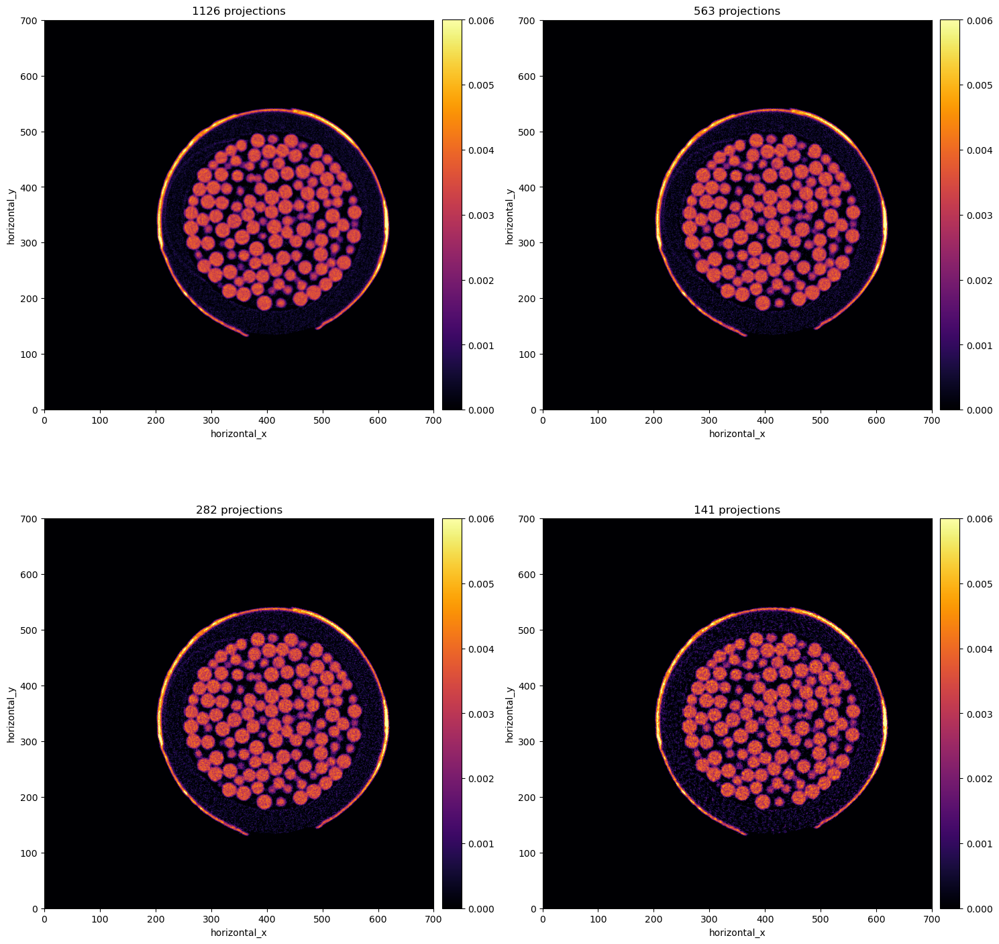

In [259]:
show2D([sirt00.solution, sirt02.solution, sirt04.solution, sirt08.solution],
      ['1126 projections', '563 projections', '282 projections', '141 projections'], 
      cmap = 'inferno', 
      fix_range=(0,0.006))

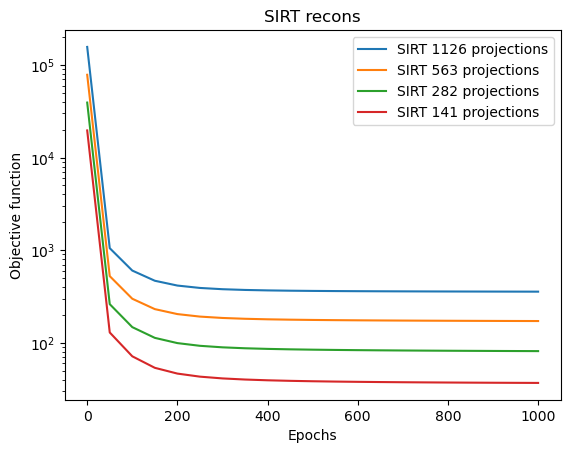

In [261]:
plt.semilogy(np.arange(0,sirt00.iteration+sirt00.update_objective_interval, sirt00.update_objective_interval),
             sirt00.objective, label='SIRT 1126 projections')
plt.semilogy(np.arange(0,sirt02.iteration+sirt02.update_objective_interval, sirt02.update_objective_interval),
             sirt02.objective, label='SIRT 563 projections')
plt.semilogy(np.arange(0,sirt04.iteration+sirt04.update_objective_interval, sirt04.update_objective_interval),
             sirt04.objective, label='SIRT 282 projections')
plt.semilogy(np.arange(0,sirt08.iteration+sirt08.update_objective_interval, sirt08.update_objective_interval),
             sirt08.objective, label='SIRT 141 projections')

plt.xlabel('Epochs')
plt.ylabel('Objective function')
plt.title('SIRT recons')
plt.legend()

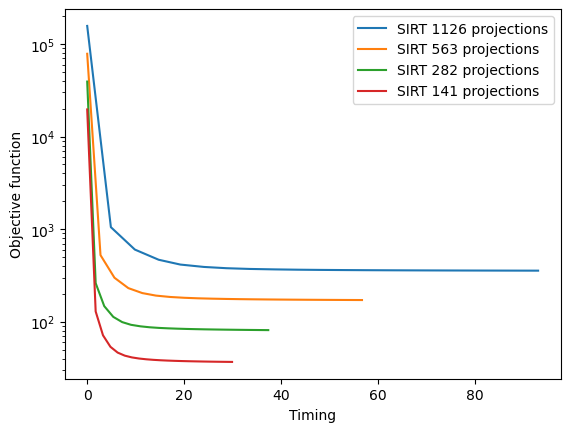

In [262]:
plt.semilogy(np.concatenate(([0],np.sort(np.cumsum(sirt00.timing)[-1:0:-sirt00.update_objective_interval]))), 
             sirt00.objective, label='SIRT 1126 projections')
plt.semilogy(np.concatenate(([0],np.sort(np.cumsum(sirt02.timing)[-1:0:-sirt02.update_objective_interval]))), 
             sirt02.objective, label='SIRT 563 projections')
plt.semilogy(np.concatenate(([0],np.sort(np.cumsum(sirt04.timing)[-1:0:-sirt04.update_objective_interval]))), 
             sirt04.objective, label='SIRT 282 projections')
plt.semilogy(np.concatenate(([0],np.sort(np.cumsum(sirt08.timing)[-1:0:-sirt08.update_objective_interval]))), 
             sirt08.objective, label='SIRT 141 projections')

plt.xlabel('Timing')
plt.ylabel('Objective function')
plt.legend()

In [267]:
sirtfbp0 = SIRT(initial=fbp_recon_2D, operator=A, data=data_clean, max_iteration=3000, lower=0.0, update_objective_interval=50)
sirtfbp2 = SIRT(initial=fbp_recon_2D2, operator=A2, data=data_clean2, max_iteration=3000, lower=0.0, update_objective_interval=50)
sirtfbp4 = SIRT(initial=fbp_recon_2D4, operator=A4, data=data_clean4, max_iteration=3000, lower=0.0, update_objective_interval=50)
sirtfbp8 = SIRT(initial=fbp_recon_2D8, operator=A8, data=data_clean8, max_iteration=3000, lower=0.0, update_objective_interval=50)

C:\Users\zhan_q\.conda\envs\cil\lib\site-packages\cil\framework\framework.py:2265: RuntimeWarning: divide by zero encountered in power
  out = pwop(self.as_array() , x2 , *args, **kwargs )


In [268]:
sirtfbp0.run(1000, verbose=1)
sirtfbp2.run(1000, verbose=1)
sirtfbp4.run(1000, verbose=1)
sirtfbp8.run(1000, verbose=1)

     Iter   Max Iter     Time/Iter            Objective
                               [s]                     
        0       3000         0.000          1.57107e+05
       50       3000         0.098          3.57722e+02
      100       3000         0.098          3.55949e+02
      150       3000         0.100          3.55304e+02
      200       3000         0.098          3.54891e+02
      250       3000         0.098          3.54578e+02
      300       3000         0.098          3.54325e+02
      350       3000         0.098          3.54108e+02
      400       3000         0.098          3.53917e+02
      450       3000         0.097          3.53745e+02
      500       3000         0.097          3.53589e+02
      550       3000         0.097          3.53444e+02
      600       3000         0.096          3.53310e+02
      650       3000         0.096          3.53185e+02
      700       3000         0.096          3.53067e+02
      750       3000         0.096          3.52

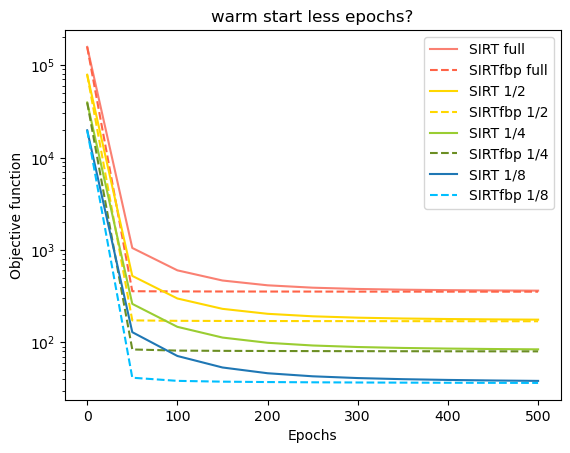

In [269]:
plt.semilogy(np.arange(0,500+sirt00.update_objective_interval, sirt00.update_objective_interval),
             sirt00.objective[0:11], label='SIRT full', color='salmon')
plt.semilogy(np.arange(0,500+sirtfbp0.update_objective_interval, sirtfbp0.update_objective_interval),
             sirtfbp0.objective[0:11], label='SIRTfbp full', ls = '--', color='tomato')

plt.semilogy(np.arange(0,500+sirt02.update_objective_interval, sirt02.update_objective_interval),
             sirt02.objective[0:11], label='SIRT 1/2', color='gold')
plt.semilogy(np.arange(0,500+sirtfbp2.update_objective_interval, sirtfbp2.update_objective_interval),
             sirtfbp2.objective[0:11], label='SIRTfbp 1/2', ls='--', color='gold')

plt.semilogy(np.arange(0,500+sirt04.update_objective_interval, sirt04.update_objective_interval),
             sirt04.objective[0:11], label='SIRT 1/4', color='yellowgreen')
plt.semilogy(np.arange(0,500+sirtfbp4.update_objective_interval, sirtfbp4.update_objective_interval),
             sirtfbp4.objective[0:11], label='SIRTfbp 1/4', ls="--", color='olivedrab')

plt.semilogy(np.arange(0,500+sirt08.update_objective_interval, sirt08.update_objective_interval),
             sirt08.objective[0:11], label='SIRT 1/8')
plt.semilogy(np.arange(0,500+sirtfbp8.update_objective_interval, sirtfbp8.update_objective_interval),
             sirtfbp8.objective[0:11], label='SIRTfbp 1/8', ls="--", color='deepskyblue')
plt.xlabel('Epochs')
plt.ylabel('Objective function')
plt.title('warm start less epochs?')
plt.legend();

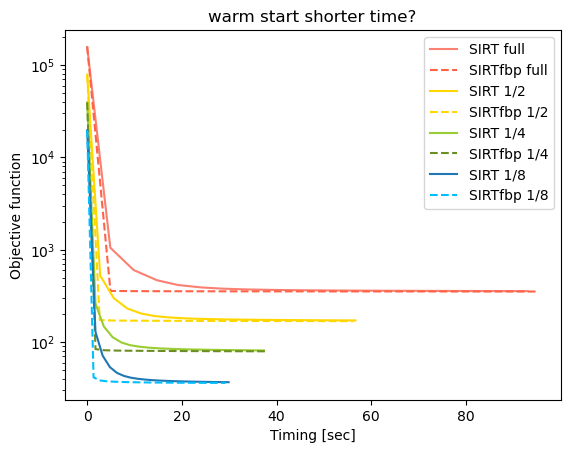

In [270]:
plt.semilogy(np.concatenate(([0],np.sort(np.cumsum(sirt00.timing)[-1:0:-sirt00.update_objective_interval]))), 
             sirt00.objective, label='SIRT full', color='salmon')
plt.semilogy(np.concatenate(([0],np.sort(np.cumsum(sirtfbp0.timing)[-1:0:-sirtfbp0.update_objective_interval]))), 
             sirtfbp0.objective, label='SIRTfbp full', ls = '--', color='tomato')

plt.semilogy(np.concatenate(([0],np.sort(np.cumsum(sirt02.timing)[-1:0:-sirt02.update_objective_interval]))), 
             sirt02.objective, label='SIRT 1/2', color='gold')
plt.semilogy(np.concatenate(([0],np.sort(np.cumsum(sirtfbp2.timing)[-1:0:-sirtfbp2.update_objective_interval]))), 
             sirtfbp2.objective, label='SIRTfbp 1/2', ls='--', color='gold')

plt.semilogy(np.concatenate(([0],np.sort(np.cumsum(sirt04.timing)[-1:0:-sirt04.update_objective_interval]))), 
             sirt04.objective, label='SIRT 1/4', color='yellowgreen')
plt.semilogy(np.concatenate(([0],np.sort(np.cumsum(sirtfbp4.timing)[-1:0:-sirtfbp4.update_objective_interval]))), 
             sirtfbp4.objective, label='SIRTfbp 1/4', ls="--", color='olivedrab')

plt.semilogy(np.concatenate(([0],np.sort(np.cumsum(sirt08.timing)[-1:0:-sirt08.update_objective_interval]))), 
             sirt08.objective, label='SIRT 1/8')
plt.semilogy(np.concatenate(([0],np.sort(np.cumsum(sirtfbp8.timing)[-1:0:-sirtfbp8.update_objective_interval]))), 
             sirtfbp8.objective, label='SIRTfbp 1/8', ls="--", color='deepskyblue')
plt.xlabel('Timing [sec]')
plt.ylabel('Objective function')
plt.title('warm start shorter time?')
plt.legend();

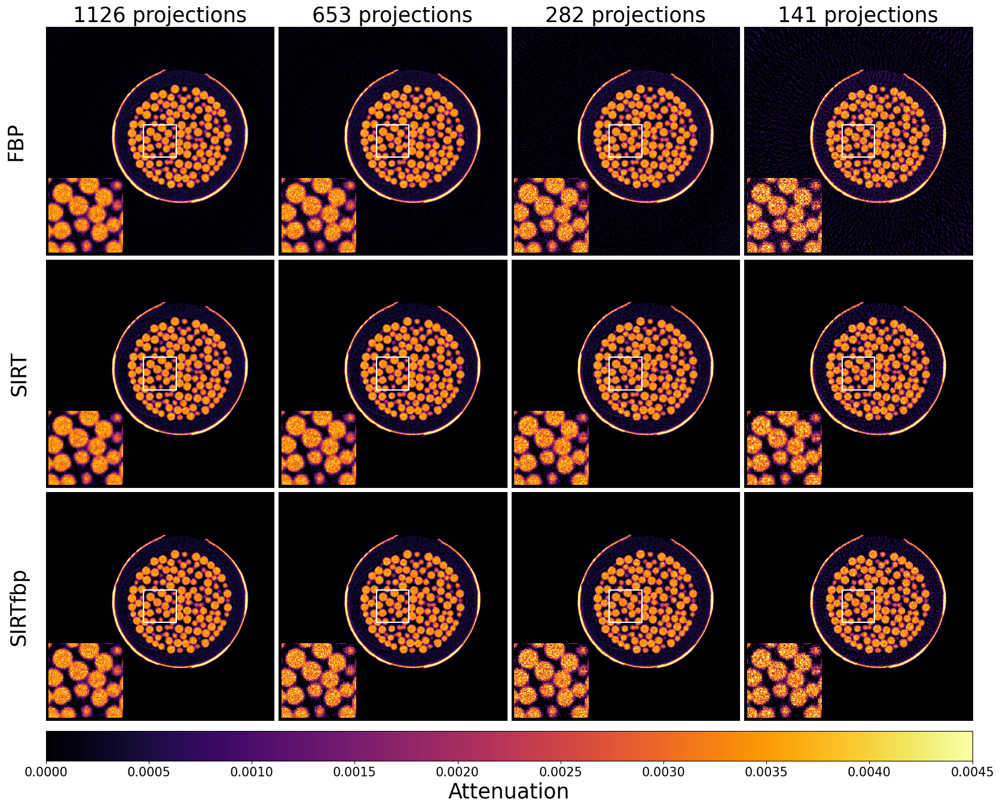

In [271]:
### Show fbp, sirt, sirt+fbp
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import AxesGrid
import numpy as np
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
from mpl_toolkits.axes_grid1.inset_locator import InsetPosition
import matplotlib.patches as patches


recons = [fbp_recon_2D.as_array(), fbp_recon_2D2.as_array(), fbp_recon_2D4.as_array(), fbp_recon_2D8.as_array(),
         sirt00.solution.as_array(), sirt02.solution.as_array(), sirt04.solution.as_array(), sirt08.solution.as_array(),
         sirtfbp0.solution.as_array(), sirtfbp2.solution.as_array(), sirtfbp4.solution.as_array(), sirtfbp8.solution.as_array()]

labels_x = ["1126 projections", "653 projections", "282 projections", "141 projections"]
labels_y = ["FBP", "SIRT", "SIRTfbp"]

# set fontszie xticks/yticks
plt.rcParams['xtick.labelsize']=15
plt.rcParams['ytick.labelsize']=15

fig = plt.figure(figsize=(20, 20))

grid = AxesGrid(fig, 111,
                nrows_ncols=(3, 4),
                axes_pad=0.08,
                cbar_mode='single',
                cbar_location='bottom',
                cbar_size = 0.5,
                cbar_pad=0.1
                )

k = 0

for ax in grid:
    im = ax.imshow(recons[k],vmin=0,vmax=0.0045, cmap="inferno")
    
    axins = zoomed_inset_axes(ax, 3, loc=2)
    ip = InsetPosition(ax, [0.01, 0.01, 0.33, 0.33]) #posx, posy, width, height
    axins.set_axes_locator(ip)
    axins.imshow(recons[k], vmin=0, vmax=0.0045, interpolation="none", cmap='inferno')

    x1, x2, y1, y2 = 300,400, 300, 400
    axins.set_xlim(x1, x2)
    axins.set_ylim(y2, y1)
    axins.tick_params(axis='both', which='both', left=False, top=False, bottom=False)
    plt.xticks(visible=False)
    plt.yticks(visible=False)
    rect = patches.Rectangle((x1, y1), 100, 100, linewidth=1.5, edgecolor='w', facecolor='none')
    ax.add_patch(rect)   
    
        
    # for the horizontal slice
    if k==0:
        ax.set_title(labels_x[0],fontsize=25)
        ax.set_ylabel(labels_y[0],fontsize=25, labelpad=20)
        
        #scalebar = AnchoredSizeBar(ax.transData,
        #                           44.13, '5 mm', 'lower right', 
        #                           pad=0.5,
        #                           color='white',
        #                           frameon=False,
        #                           size_vertical=5)

        #ax.add_artist(scalebar)        

        
    if k==1:
        ax.set_title(labels_x[1],fontsize=25)
    if k==2:
        ax.set_title(labels_x[2],fontsize=25)
    if k==3:        
        ax.set_title(labels_x[3],fontsize=25)
        
    if k==4:        
        ax.set_ylabel(labels_y[1],fontsize=25, labelpad=20) 
        
    if k==8:        
        ax.set_ylabel(labels_y[2],fontsize=25, labelpad=20)  
        
    if k!=0:
        ax.tick_params(axis='both', which='both', 
                           left=False, bottom=False, top=False) 
    k+=1

    ax.set_xticks([])
    ax.set_yticks([]) 
   
cbar = ax.cax.colorbar(im)
cbar.ax.set_xlabel('Attenuation', fontsize=25)

plt.show()

In [272]:
from cil.io import TIFFWriter
save_base_path ='E:\\Zhan_q\\P20220873\\03_evaluation\\test_06_ct20s'
save_path = os.path.join(save_base_path, 'nv400')
os.makedirs(save_path)

TIFFWriter(data=fbp_recon_2D, file_name=os.path.join(save_path, "fbp0")).write()
TIFFWriter(data=fbp_recon_2D2, file_name=os.path.join(save_path, "fbp2")).write()
TIFFWriter(data=fbp_recon_2D4, file_name=os.path.join(save_path, "fbp4")).write()
TIFFWriter(data=fbp_recon_2D8, file_name=os.path.join(save_path, "fbp8")).write()

TIFFWriter(data=sirt00.solution, file_name=os.path.join(save_path, "sirt00")).write()
TIFFWriter(data=sirt02.solution, file_name=os.path.join(save_path, "sirt02")).write()
TIFFWriter(data=sirt04.solution, file_name=os.path.join(save_path, "sirt04")).write()
TIFFWriter(data=sirt08.solution, file_name=os.path.join(save_path, "sirt08")).write()

TIFFWriter(data=sirtfbp0.solution, file_name=os.path.join(save_path, "sirtfbp0")).write()
TIFFWriter(data=sirtfbp2.solution, file_name=os.path.join(save_path, "sirtfbp2")).write()
TIFFWriter(data=sirtfbp4.solution, file_name=os.path.join(save_path, "sirtfbp4")).write()
TIFFWriter(data=sirtfbp8.solution, file_name=os.path.join(save_path, "sirtfbp8")).write()


### TV regularisation

In [304]:
from cil.optimisation.functions import L2NormSquared, L1Norm, BlockFunction, MixedL21Norm, IndicatorBox, TotalVariation
from cil.optimisation.operators import GradientOperator, BlockOperator
from cil.optimisation.algorithms import PDHG

# Define BlockFunction F
alpha_tv = 1
f1 = alpha_tv * MixedL21Norm()
f2 = 0.5 * L2NormSquared(b=data_clean8)
F = BlockFunction(f1, f2)

# Define BlockOperator K
Grad = GradientOperator(ig2D8)
K = BlockOperator(Grad, A8)

# Define Function G
G = IndicatorBox(lower=0)


# Setup and run PDHG
pdhg_tv_explicit = PDHG(f = F, g = G, operator = K,
            max_iteration = 80000,
            update_objective_interval = 100)

In [315]:
pdhg_tv_explicit.run(20000, verbose=2)

     Iter   Max Iter     Time/Iter        Primal          Dual     Primal-Dual
                               [s]     Objective     Objective             Gap
    20000      80000         0.061    8.23535e+01   1.32835e+01    6.90700e+01
    20100      80000         0.061    8.22513e+01   1.33231e+01    6.89282e+01
    20200      80000         0.061    8.21471e+01   1.33283e+01    6.88188e+01
    20300      80000         0.061    8.20353e+01   1.33520e+01    6.86833e+01
    20400      80000         0.061    8.19422e+01   1.34331e+01    6.85091e+01
    20500      80000         0.061    8.18702e+01   1.35005e+01    6.83697e+01
    20600      80000         0.061    8.17848e+01   1.35083e+01    6.82766e+01
    20700      80000         0.061    8.16845e+01   1.35277e+01    6.81568e+01
    20800      80000         0.061    8.15924e+01   1.35814e+01    6.80110e+01
    20900      80000         0.061    8.15253e+01   1.36526e+01    6.78727e+01
    21000      80000         0.061    8.14261e+01   

    30200      80000         0.059    7.51290e+01   1.71206e+01    5.80084e+01
    30300      80000         0.059    7.50937e+01   1.71322e+01    5.79616e+01
    30400      80000         0.059    7.50476e+01   1.71580e+01    5.78896e+01
    30500      80000         0.059    7.50061e+01   1.72060e+01    5.78001e+01
    30600      80000         0.059    7.49489e+01   1.72497e+01    5.76992e+01
    30700      80000         0.059    7.48964e+01   1.72747e+01    5.76217e+01
    30800      80000         0.059    7.48360e+01   1.72975e+01    5.75384e+01
    30900      80000         0.059    7.47622e+01   1.73160e+01    5.74462e+01
    31000      80000         0.059    7.47022e+01   1.73537e+01    5.73485e+01
    31100      80000         0.059    7.46677e+01   1.74079e+01    5.72597e+01
    31200      80000         0.059    7.46541e+01   1.74459e+01    5.72082e+01
    31300      80000         0.059    7.46133e+01   1.74553e+01    5.71581e+01
    31400      80000         0.058    7.45285e+01   

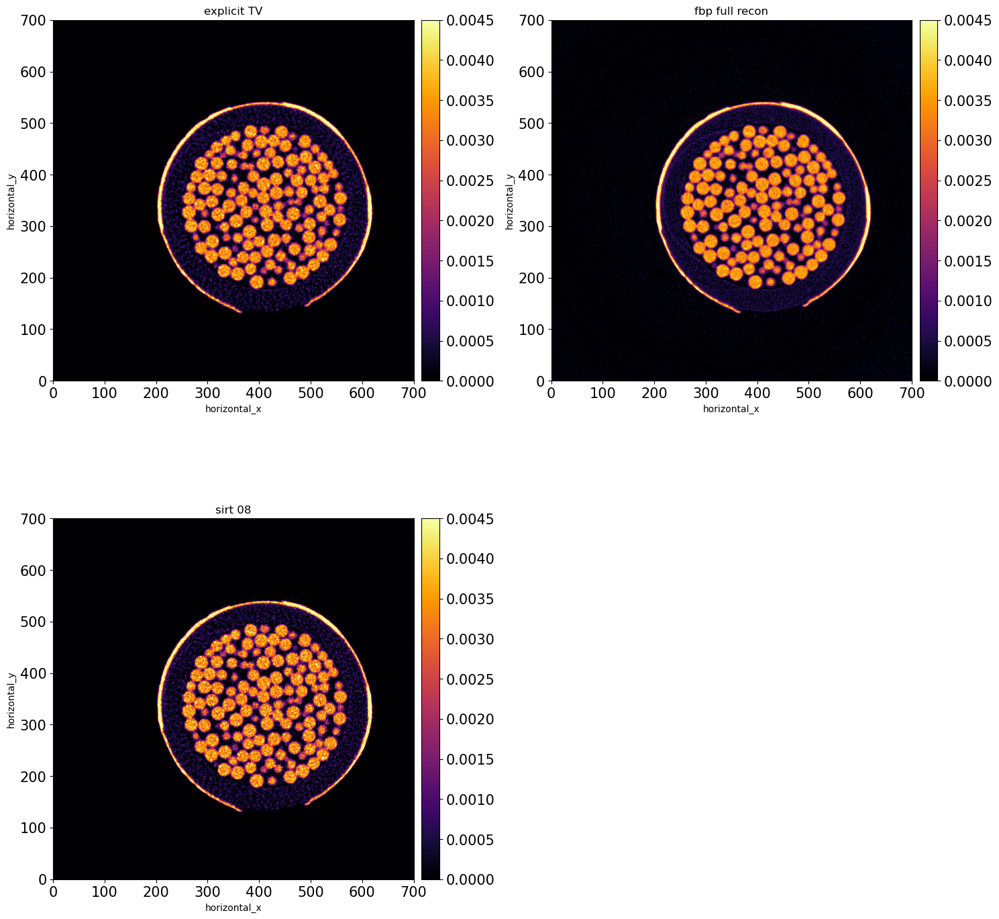

In [314]:
show2D([pdhg_tv_explicit.solution, fbp_recon_2D, sirt08.solution],
      ['explicit TV', 'fbp full recon', 'sirt 08'],
      fix_range=(0,0.0045),
      cmap='inferno')

In [317]:
fbp0_ct20s_400 = fbp_recon_2D
fbp2_ct20s_400 = fbp_recon_2D2
fbp4_ct20s_400 = fbp_recon_2D4
fbp8_ct20s_400 = fbp_recon_2D8
%store fbp0_ct20s_400 
%store fbp2_ct20s_400
%store fbp4_ct20s_400
%store fbp8_ct20s_400

Stored 'fbp0_ct20s_400' (ImageData)
Stored 'fbp2_ct20s_400' (ImageData)
Stored 'fbp4_ct20s_400' (ImageData)
Stored 'fbp8_ct20s_400' (ImageData)
